<a href="https://colab.research.google.com/github/Twistovni/INTELIG-NCIA-ARTIFICIAL-APLICADA/blob/main/IA_APLICADA_Aula3_part1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Tutorial GAN Stable Diffusion**

## Instalando Bibliotecas necessárias
* diffusers
* scipy
* ftfy
* transformers
* accelerate
* ftfy

In [ ]:
pip install diffusers transformers accelerate scipy safetensors ftfy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.8 MB/s eta 0:00:00


### Stable Diffusion Pipeline

`StableDiffusionPipeline` é um pipeline de inferência ponta a ponta que você pode usar para gerar imagens de texto com poucas linhas de código.

Primeiro, carregamos os pesos pré-treinados de todos os componentes do modelo.


* [CompVis/stable-diffusion-v1-4](https://huggingface.co/CompVis/stable-diffusion-v1-4)
* [runwayml/stable-diffusion-v1-5](https://huggingface.co/runwayml/stable-diffusion-v1-5)
* [stabilityai/stable-diffusion-2-1-base](https://huggingface.co/stabilityai/stable-diffusion-2-1-base)
* [stabilityai/stable-diffusion-2-1](https://huggingface.co/stabilityai/stable-diffusion-2-1).

Podemos definir a precisão do modelo usando o parâmetro:
`torch_dtype=torch.float16`.


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/50 [00:00<?, ?it/s]

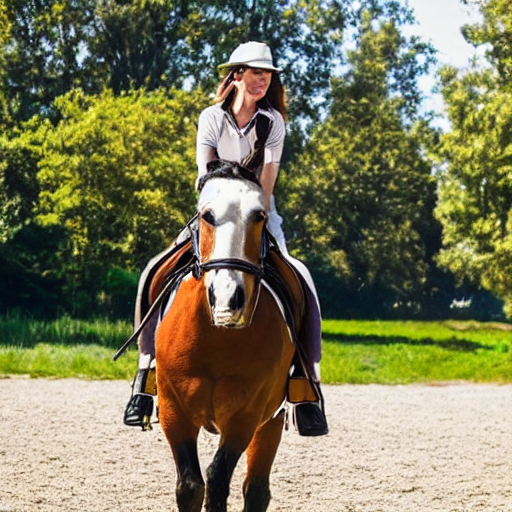

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

# carrega modelo com precisão 16
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)
# processar modelo na GPU
pipe = pipe.to("cuda")
# Definir prmpt
prompt = "a woman riding a horse in a sunny day"
# acessar imagem gerada após inferência do modelo
image = pipe(prompt).images[0]
#exibir imagem gerada
image

se rodarmos o código acima muitas vezes, vamos obter imagens diferentes

  0%|          | 0/50 [00:00<?, ?it/s]

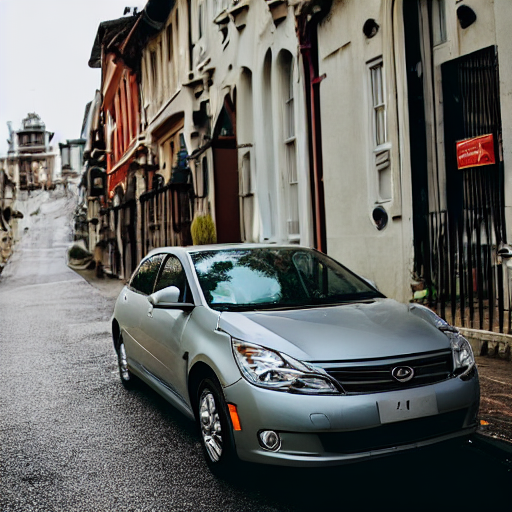

In [ ]:
import torch

#prompt = "cats and dogs playing in the beach"
prompt = "car parked in the street"
image = pipe(prompt).images[0]
image

Trocando modelo pré-treinado

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

# carrega modelo com precisão 16
pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1", torch_dtype=torch.float16)
# processar modelo na GPU
pipe = pipe.to("cuda")
# Definir prmpt
#prompt = "a photograph of an astronaut riding a horse"
prompt ="car parked in the street"
# acessar imagem gerada após inferência do modelo
image = pipe(prompt).images[0]
#exibir imagem gerada
image

Couldn't connect to the Hub: 401 Client Error. (Request ID: Root=1-699ba93b-7b54260a05d1181162ef626f;96c5ffd3-1325-4acb-af31-05f16065c790)

Repository Not Found for url: https://huggingface.co/api/models/stabilityai/stable-diffusion-2-1.
Please make sure you specified the correct `repo_id` and `repo_type`.
If you are trying to access a private or gated repo, make sure you are authenticated. For more details, see https://huggingface.co/docs/huggingface_hub/authentication
Invalid username or password..
Will try to load from local cache.


OSError: Cannot load model stabilityai/stable-diffusion-2-1: model is not cached locally and an error occurred while trying to fetch metadata from the Hub. Please check out the root cause in the stacktrace above.

In [ ]:
image = pipe(prompt).images[0]
#exibir imagem gerada
image

quando a semente aleatório `manual_seed` é fixada, o modelo gera sempre a mesma imagem para o prompt informado

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

#pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)
#pipe = pipe.to("cuda")

prompt = "a man walking in a street of sao paulo"
generator = torch.Generator("cuda").manual_seed(1024)
image = pipe(prompt, generator=generator).images[0]
image

In [ ]:
image = pipe(prompt, generator=generator).images[0]
image

* Você pode alterar o número de etapas de inferência usando o argumento num_inference_steps. Em geral, os resultados serão melhores quanto mais etapas você usar.



In [ ]:
import torch
#from diffusers import StableDiffusionPipeline
#pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)
#pipe = pipe.to("cuda")
prompt = "a man walking in a street of sao paulo"

generator = torch.Generator("cuda").manual_seed(4048) #1024

image = pipe(prompt, num_inference_steps=100, generator=generator).images[0]

image




O outro parâmetro na chamada do pipeline é guidance_scale. É uma forma de aumentar a aderência ao sinal condicional que neste caso é o texto, bem como a qualidade geral da amostra. Em termos simples, a orientação livre do classificador força a geração a corresponder melhor ao prompt. Números como 7 ou 8,5 dão bons resultados; se você usar um número muito grande, as imagens podem parecer boas, mas serão menos diversificadas.


Para gerar múltiplas imagens para o mesmo prompt, simplesmente usamos uma lista com o mesmo prompt repetido diversas vezes. Enviaremos a lista para o pipeline em vez da string que usamos antes.

A função auxiliar a seguir exibe uma grade de imagens.

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/50 [00:00<?, ?it/s]

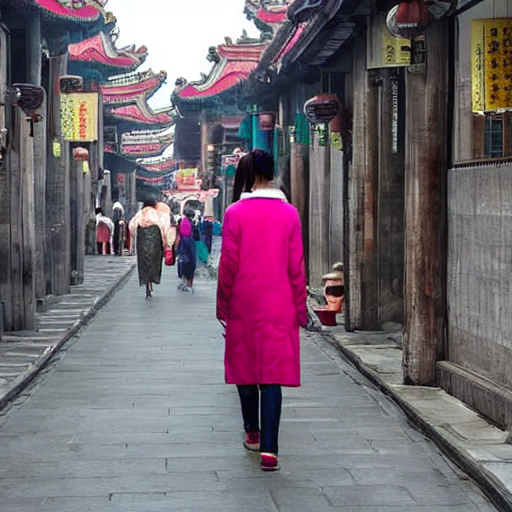

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)
pipe = pipe.to("cuda")
prompt = "a woman walking in a street of china"

generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, num_inference_steps=50, generator=generator, guidance_scale=5).images[0]
#guidance_scale=20,
image

In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

Now, we can generate a grid image once having run the pipeline with a list of 3 prompts.

  0%|          | 0/50 [00:00<?, ?it/s]

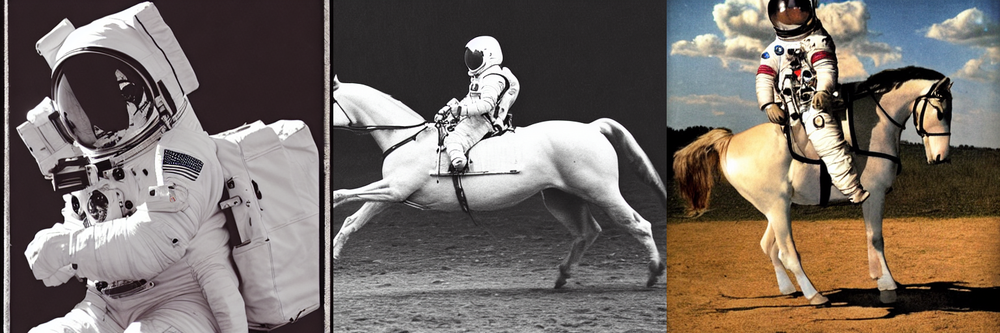

In [ ]:
num_images = 3
prompt = ["a photograph of an astronaut riding a horse"] * num_images

images = pipe(prompt).images

grid = image_grid(images, rows=1, cols=3)
grid

And here's how to generate a grid of `n × m` images.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

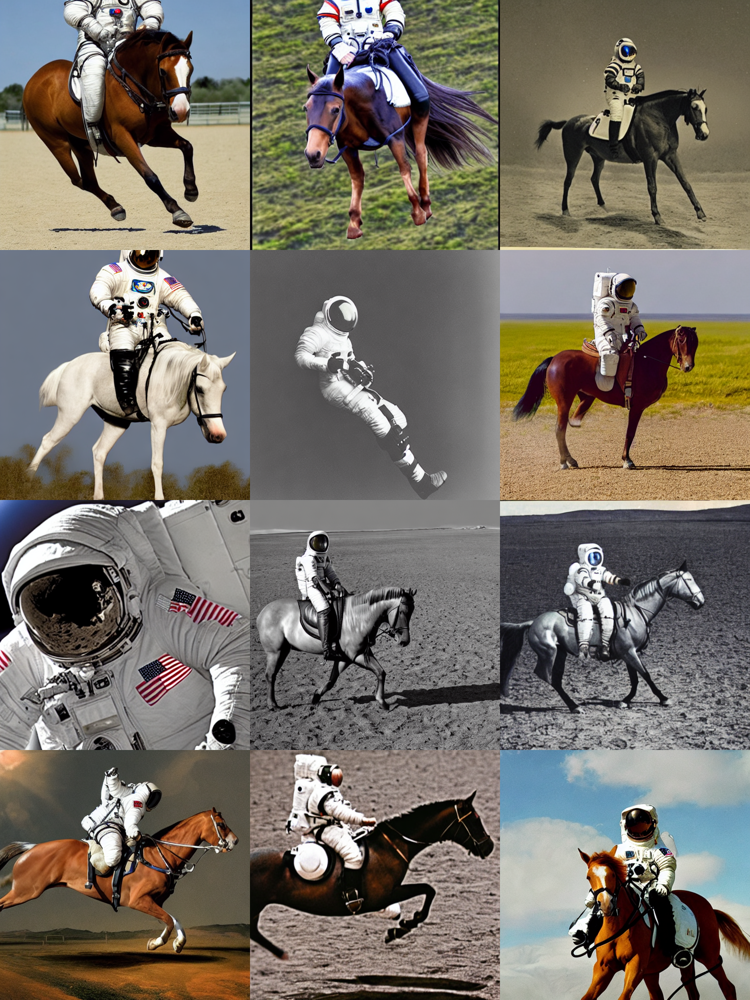

In [ ]:
num_cols = 3
num_rows = 4

prompt = ["a photograph of an astronaut riding a horse"] * num_cols

all_images = []
for i in range(num_rows):
  images = pipe(prompt).images
  all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

### Gerando imagens de diferentes tamanhos

  0%|          | 0/50 [00:00<?, ?it/s]

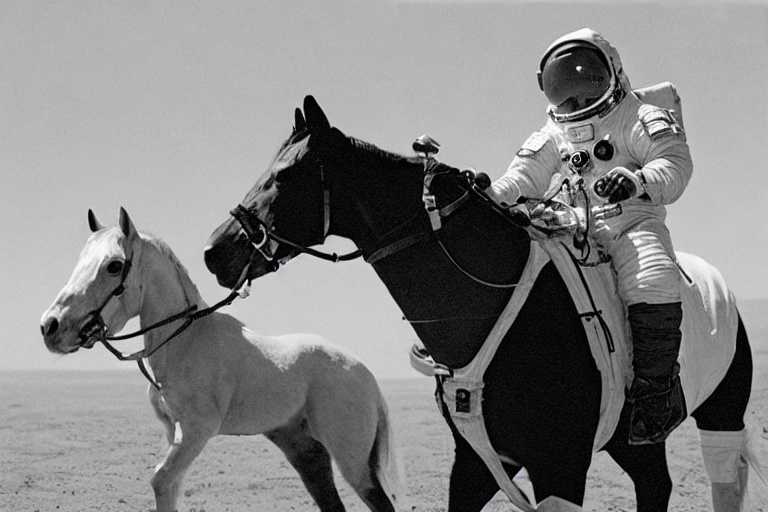

In [ ]:
prompt = "a photograph of an astronaut riding a horse"

image = pipe(prompt, height=512, width=768).images[0]
image

Upscaler

In [ ]:
import requests
from PIL import Image
from io import BytesIO
from diffusers import StableDiffusionUpscalePipeline
import torch

# load model and scheduler
model_id = "stabilityai/stable-diffusion-x4-upscaler"
pipeline = StableDiffusionUpscalePipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipeline = pipeline.to("cuda")

# let's download an  image
url = "https://huggingface.co/datasets/hf-internal-testing/diffusers-images/resolve/main/sd2-upscale/low_res_cat.png"
response = requests.get(url)
low_res_img = Image.open(BytesIO(response.content)).convert("RGB")
low_res_img = low_res_img.resize((128, 128))

prompt = "a white cat"

upscaled_image = pipeline(prompt=prompt, image=low_res_img).images[0]
upscaled_image.save("upsampled_cat.png")

model_index.json:   0%|          | 0.00/485 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/372 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-x4-upscaler/snapshots/572c99286543a273bfd17fac263db5a77be12c4c/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/75 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_upscale.py:528: FutureWarning: `upcast_vae` is deprecated and will be removed in version 1.0.0. `upcast_vae` is deprecated. Please use `pipe.vae.to(torch.float32)`. For more details, please refer to: https://github.com/huggingface/diffusers/pull/12619#issue-3606633695.
  deprecate(
